# Laboratorium 4 - rekomendacje dla portali informacyjnych

## Przygotowanie

 * pobierz i wypakuj dataset: https://mind201910small.blob.core.windows.net/release/MINDsmall_train.zip
   * więcej możesz poczytać tutaj: https://learn.microsoft.com/en-us/azure/open-datasets/dataset-microsoft-news
 * [opcjonalnie] Utwórz wirtualne środowisko
 `python3 -m venv ./recsyslab4`
 * zainstaluj potrzebne biblioteki:
 `pip install nltk sklearn`

## Część 1. - przygotowanie danych

In [2]:
# importujemy wszystkie potrzebne pakiety

import codecs
from collections import defaultdict # mozesz uzyc zamiast zwyklego slownika, rozwaz wplyw na czas obliczen
import math
import re
from string import punctuation

import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords
from nltk.stem import RSLPStemmer
from nltk.stem import WordNetLemmatizer
from nltk.stem.lancaster import LancasterStemmer
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer

# mozesz uzyc do obliczania najbardziej podobnych tekstow zamiast liczenia "na piechote"
# ale pamietaj o dostosowaniu formatu danych
from sklearn.neighbors import NearestNeighbors

# na potrzeby wizualizacji
import matplotlib.pyplot as plt
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/wiktorgut/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# definiujemy potrzebne zmienne

PATH = './MINDsmall_train'
STOPWORDS = set(stopwords.words('english'))

In [4]:
# wczytujemy metadane artykułów

def parse_news_entry(entry):
    news_id, category, subcategory, title, abstract = entry.split('\t')[:5]
    return {
        'news_id': news_id,
        'category': category,
        'subcategory': subcategory,
        'title': title,
        'abstract': abstract
    }

def get_news_metadata():
    with codecs.open(f'{PATH}/news.tsv', 'r', 'UTF-8') as f:
        raw = [x for x in f.read().split('\n') if x]
        parsed_entries = [parse_news_entry(entry) for entry in raw]
        return {x['news_id']: x for x in parsed_entries}

news = get_news_metadata()
news_ids = sorted(list(news.keys()))
news_indices = {x[1]: x[0] for x in enumerate(news_ids)}
print(len(news))
print(news_indices)

51282
{'N10': 0, 'N100': 1, 'N1000': 2, 'N10000': 3, 'N10001': 4, 'N10002': 5, 'N10003': 6, 'N10004': 7, 'N10005': 8, 'N10007': 9, 'N10009': 10, 'N1001': 11, 'N10010': 12, 'N10011': 13, 'N10013': 14, 'N10014': 15, 'N10015': 16, 'N10016': 17, 'N1002': 18, 'N10021': 19, 'N10022': 20, 'N10023': 21, 'N10024': 22, 'N10025': 23, 'N10026': 24, 'N10027': 25, 'N10029': 26, 'N1003': 27, 'N10031': 28, 'N10032': 29, 'N10033': 30, 'N10034': 31, 'N10035': 32, 'N10037': 33, 'N10038': 34, 'N10039': 35, 'N1004': 36, 'N10040': 37, 'N10041': 38, 'N10042': 39, 'N10044': 40, 'N10046': 41, 'N10047': 42, 'N10048': 43, 'N10049': 44, 'N10051': 45, 'N10052': 46, 'N10053': 47, 'N10055': 48, 'N10056': 49, 'N10057': 50, 'N10058': 51, 'N10059': 52, 'N1006': 53, 'N10060': 54, 'N10061': 55, 'N10062': 56, 'N10063': 57, 'N10064': 58, 'N10065': 59, 'N10066': 60, 'N10067': 61, 'N10068': 62, 'N1007': 63, 'N10070': 64, 'N10072': 65, 'N10073': 66, 'N10074': 67, 'N10075': 68, 'N10076': 69, 'N10077': 70, 'N10078': 71, 'N10079

In [5]:
def parse_history_entry(entry):
    _id, user_id, _time, history, _impressions = entry.split('\t')
    history = [x for x in history.split() if x]
    return user_id, history

def get_users_history():
    with codecs.open(f'{PATH}/behaviors.tsv', 'r', 'UTF-8') as f:
        lines = [x for x in f.read().split('\n') if x]
        entries = [parse_history_entry(x) for x in lines]
        return dict(entries)

users_history = get_users_history()
test_users = 'U53231', 'U89744', 'U10045', 'U92486', 'U70879'
print(len(users_history))

50000


## Część 2. - TF-IDF

In [6]:
# normalizujemy teksty na potrzeby dalszego przetwarzania
from nltk.tokenize import word_tokenize
# nltk.download('punkt_tab')
# nltk.download('rslp')

def preprocess_text(text):
    # zamieniamy wszystkie ciagi bialych znakow na pojedyncze spacje
    text = re.sub(r'\s+', ' ', text)
    # usuwamy znaki interpunkcyjne
    # usuwamy wszystkie liczby
    text = ''.join(char for char in text if char not in punctuation and not char.isdigit())
    # podmieniamy wszystkie wielkie litery
    text = text.lower()
    # dzielimy na tokeny
    tokens = word_tokenize(text)
    # usuwamy stopwords
    stop_words = set(nltk.corpus.stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]
    return tokens

def stem_texts(corpus):
    # stemmer = PorterStemmer()
    stemmer = LancasterStemmer()
    # stemmer = RSLPStemmer()
    # stemmer = SnowballStemmer('english')

    return [[stemmer.stem(word) for word in preprocess_text(text)] for text in corpus]

texts = [news[news_id]['abstract'] for news_id in news_ids]
stemmed_texts = stem_texts(texts)

In [7]:
# porownajmy teksty przed i po przetworzeniu

print(texts[2] + '\n')
print(' '.join(stemmed_texts[2]))

"I think we have a really good team, and a team that can really do some special, good things because that group is very close in there." - Brian Schmetzer

think real good team team real spec good thing group clos bri schmetzer


In [8]:
# tworzymy liste wszystkich slow w korpusie

def get_all_words_sorted(corpus):
    # generujemy posortowana alfabetycznie liste wszystkich slow (tokenow)
    corpus = [item for sublist in corpus for item in sublist]
    result = list(set(corpus))
    result.sort()
    return result

wordlist = get_all_words_sorted(stemmed_texts)
word_indices = {x[1]: x[0] for x in enumerate(wordlist)}
print(len(wordlist))

37018


In [9]:
# obliczamy liczbe tekstow, w ktorych wystapilo kazde ze slow
# pamietaj, ze jesli slowo wystapilo w danym tekscie wielokrotnie, to liczymy je tylko raz

def get_document_frequencies(corpus, wordlist):
    frequencies_count = {word:0 for word in wordlist}
    for text in corpus:
        for word in set(text):
            frequencies_count[word] += 1
    return frequencies_count

document_frequency = get_document_frequencies(stemmed_texts, wordlist)

In [10]:
# obliczamy liczbe wystapien kazdego slowa w kazdym tekscie

def get_term_frequencies(corpus, news_indices):
    # return {news_id -> {word -> count}}
    frequencies_count = {}
    # print(frequencies_count)
    for indice in news_indices:
        frequencies_count[indice] = defaultdict(int)
        text = corpus[news_indices[indice]]
        for word in text:
            frequencies_count[indice][word] += 1
    return frequencies_count

term_frequency = get_term_frequencies(stemmed_texts, news_indices)
# {indice: {word : 0 for word in wordlist} for indice in news_indices}


In [11]:
# sprawdzmy wyniki

term_frequency[news_ids[2]]

defaultdict(int,
            {'think': 1,
             'real': 2,
             'good': 2,
             'team': 2,
             'spec': 1,
             'thing': 1,
             'group': 1,
             'clos': 1,
             'bri': 1,
             'schmetzer': 1})

In [12]:
# obliczamy metryke tf_idf

def calculate_tf_idf(term_frequency, document_frequency, corpus_size):
    # return {news_id -> {word -> tf_idf}}
    tf_idf = {}
    for indice in term_frequency:
        tf_idf[indice] = {}
        for word in term_frequency[indice]:
            tf = term_frequency[indice][word]
            idf = math.log(corpus_size/document_frequency[word])
            tf_idf[indice][word] = tf*idf
    return tf_idf

tf_idf = calculate_tf_idf(term_frequency, document_frequency, len(news_ids))
tf_idf

{'N10': {'fartlek': 10.845095092394073},
 'N100': {'washington': 4.145594752232395,
  'somewh': 6.541029999189903,
  'eastern': 5.727101279977318,
  'ski': 6.367758277915867,
  'astro': 4.843680214432923,
  'assembl': 6.582415215352758,
  'on': 2.5202737936252917,
  'airpl': 7.107425474110705,
  'nat': 3.2097912061346583,
  'capit': 5.48850881772206,
  'team': 6.054134307726688,
  'confer': 10.845095092394073,
  'conundr': 10.845095092394073,
  'playerson': 10.151947911834128,
  'meet': 4.480344335542162,
  'wednesday': 3.176533984378176,
  'wretch': 10.845095092394073,
  'loss': 4.164240413603858,
  'gam': 2.8816350257551027,
  'run': 3.816893660336069,
  'two': 2.8017529219524646,
  'vet': 4.277017180982098,
  'calm': 6.9532747942834465,
  'concern': 5.052081484009929,
  'crop': 7.083894976700511,
  'justin': 5.6633115421019875,
  'verland': 6.837761907161602,
  'jos': 6.402443835903757,
  'altuv': 7.2897470309046595,
  'emphas': 7.477799262407599,
  'enco': 6.450645937721634,
  'rem

In [13]:
# sprawdzmy wyniki

tf_idf[news_ids[2]]

{'think': 4.358934303449984,
 'real': 7.794316047558208,
 'good': 8.080961144662899,
 'team': 6.054134307726688,
 'spec': 4.4009638356936325,
 'thing': 4.111693200556713,
 'group': 4.260303700008357,
 'clos': 3.7360329567069006,
 'bri': 5.592821664347443,
 'schmetzer': 9.458800731274183}

## Część 3. - Podobieństwo tekstów

In [14]:
# obliczmy odleglosc miedzy dwoma artykulami
# przetestuj rozne metryki odleglosci i wybierz najlepsza

def getValue(dictionary, id):
    if id in dictionary:
        return dictionary[id]
    return 0

def calculate_distance(tf_idf, id1, id2, metric):
    allwords = set([word for word in tf_idf[id1]] + [word for word in tf_idf[id2]])
    if metric == 'euclidean':
        return math.sqrt(sum([(getValue(tf_idf[id1], word) - getValue(tf_idf[id2], word)) ** 2 for word in allwords]))
    elif metric == 'manhattan':
        return sum([abs(getValue(tf_idf[id1],word) + getValue(tf_idf[id2],word)) for word in allwords])

print("Euclidian:", calculate_distance(tf_idf, news_ids[2], news_ids[1], "euclidean"))
print("Manhattan:", calculate_distance(tf_idf, news_ids[2], news_ids[1], 'manhattan'))


Euclidian: 42.6074265439805
Manhattan: 279.84208632176393


In [15]:
# funkcja pomocnicza do wyswietlania artykulow
def print_news_entry(n_id, corpus):
    print(f'id: {n_id}\n\ttitle: {corpus[n_id]["title"]}\n\ttext: {corpus[n_id]["abstract"]}')

print_news_entry('N42782', news)

id: N42782
	title: Three takeaways from Yankees' ALCS Game 5 victory over the Astros
	text: The Yankees kept hope alive thanks to some impressive starting pitching and a pair of early home runs.


In [16]:
# wyznaczmy k najpodobniejszych tekstow do danego
# pamietaj o odpowiedniej kolejnosci sortowania w zaleznosci od wykorzystanej metryki
# pamietaj, zeby wsrod podobnych tekstow nie bylo danego
print(news_ids)
def get_k_most_similar_news(tf_idf, n_id, k):
    similarNewsMeasured = [(calculate_distance(tf_idf, news, n_id, "euclidean"), news) for news in news_ids if news != n_id]
    similarNewsMeasured.sort()
    print([s[1] for s in similarNewsMeasured][:k])
    return [s[1] for s in similarNewsMeasured][:k]

def print_k_most_similar_news(tf_idf, n_id, k, corpus):
    similar = get_k_most_similar_news(tf_idf, n_id, k)
    print_news_entry(n_id, corpus)
    print(f'\n{k} most similar:')
    for s_id in similar:
       print_news_entry(s_id, corpus)

print_k_most_similar_news(tf_idf, news_ids[42337], 5, news)

['N10', 'N100', 'N1000', 'N10000', 'N10001', 'N10002', 'N10003', 'N10004', 'N10005', 'N10007', 'N10009', 'N1001', 'N10010', 'N10011', 'N10013', 'N10014', 'N10015', 'N10016', 'N1002', 'N10021', 'N10022', 'N10023', 'N10024', 'N10025', 'N10026', 'N10027', 'N10029', 'N1003', 'N10031', 'N10032', 'N10033', 'N10034', 'N10035', 'N10037', 'N10038', 'N10039', 'N1004', 'N10040', 'N10041', 'N10042', 'N10044', 'N10046', 'N10047', 'N10048', 'N10049', 'N10051', 'N10052', 'N10053', 'N10055', 'N10056', 'N10057', 'N10058', 'N10059', 'N1006', 'N10060', 'N10061', 'N10062', 'N10063', 'N10064', 'N10065', 'N10066', 'N10067', 'N10068', 'N1007', 'N10070', 'N10072', 'N10073', 'N10074', 'N10075', 'N10076', 'N10077', 'N10078', 'N10079', 'N1008', 'N10080', 'N10081', 'N10083', 'N10084', 'N10085', 'N10087', 'N10088', 'N10089', 'N1009', 'N10090', 'N10091', 'N10092', 'N10093', 'N10094', 'N10095', 'N10097', 'N10098', 'N10099', 'N101', 'N1010', 'N10100', 'N10101', 'N10102', 'N10103', 'N10107', 'N10108', 'N10109', 'N1011

## Część 4. - Profile użytkowników

In [17]:
# oblicz srednia z wektorow tf-idf artykulow o zadanych id-kach

# def calculate_average_vector(tf_idf, news_ids: list[str]) -> dict[str, float]:
#     avg_vector = [0 for _ in wordlist]
#     if len(news_ids)==0:
#         return avg_vector
#     for news in news_ids:
#         for i in range(len(wordlist)):
#             if wordlist[i] in tf_idf[news]:
#                 avg_vector[i] += tf_idf[news][wordlist[i]]
#     return [i/len(news_ids) for i in avg_vector]

# w przykładzie powyej normalnie liczyliśmy całą tablicę (wektor) dla wszystkich słów,
# tutaj to się wywala obliczeniowo więc muszę polecieć słownikiem tylko ze słów które występują

# wykorzystaj powyzsza funkcje, by policzyc wektor kazdego uzytkownika
# def calculate_users_vectors(tf_idf, users_history) -> dict[str, list]:
#     users_vectors = {}
#     for user_id, news_ids in users_history.items():
#         average_vector = calculate_average_vector(tf_idf, news_ids)
#         users_vectors[user_id] = average_vector
#     return users_vectors

def calculate_average_vector(tf_idf, news_ids: list[str]) -> dict[str, float]:
    avg_words_tf_idf = defaultdict(int)
    if len(news_ids)==0:
        return {}
    for news in news_ids:
        for word in stemmed_texts[news_indices[news]]:
            avg_words_tf_idf[word] += tf_idf[news][word]
    return {word: avg_words_tf_idf[word]/len(news_ids) for word in avg_words_tf_idf}


# def calculate_users_vectors(tf_idf, users_history) -> dict[str, list]:
#     users_vectors = {}
#     for user_id, news_ids in users_history.items():
#         average_vector = calculate_average_vector(tf_idf, news_ids)
#         users_vectors[user_id] = [getValue(average_vector, word) for word in wordlist]
#     return users_vectors

def calculate_users_vectors(tf_idf, users_history) -> dict[str, list]:
    users_vectors = {}
    for user_id, news_ids in users_history.items():
        average_vector = calculate_average_vector(tf_idf, news_ids)
        users_vectors[user_id] = average_vector
    return users_vectors


user_vectors = calculate_users_vectors(tf_idf, users_history)


In [18]:
# sprawdz wyliczony profil dla przykladowego uzytkownika
print(sorted([(k,v) for k,v in user_vectors[test_users[0]].items() if v], key=lambda x: -x[1]))

[('fir', 6.590409101008854), ('diaz', 3.9393436421786547), ('ditch', 2.6244955467598543), ('plan', 2.361989966066722), ('land', 1.9438340525832376), ('tornado', 1.9140254884839598), ('storm', 1.7237506706777992), ('hailston', 1.4502782731191612), ('accord', 1.411252359735779), ('ventur', 1.296710027488922), ('may', 1.2597210334884206), ('impeach', 1.2566972077646668), ('noa', 1.2522362215306053), ('acr', 1.211172480322256), ('californ', 1.2018649437793008), ('aircraft', 1.1996358405980325), ('county', 1.1313195220997379), ('hous', 1.0860645652002618), ('mar', 1.0701901479418672), ('ef', 1.0634139586759883), ('report', 1.0423187475759603), ('mcconnell', 1.0296441332382409), ('saud', 0.9848359105446637), ('hudson', 0.9794444351185427), ('hors', 0.9551731441477715), ('sant', 0.954256586044526), ('paul', 0.9247622150502931), ('blood', 0.9180363549424965), ('marc', 0.9033295021921476), ('reliev', 0.892853606037069), ('licens', 0.8726995205713682), ('shelt', 0.8677729239897726), ('behind', 0

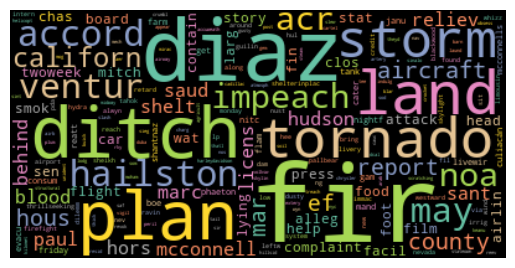

In [19]:
# skorzystajmy ze znanej juz biblioteki, by to lepiej zwizualizowac
def plot_vector(tf_idf_vector):
    wordcloud = WordCloud(random_state=42, background_color='black', colormap='Set2')
    wordcloud.generate_from_frequencies(frequencies=tf_idf_vector)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

plot_vector(user_vectors[test_users[0]])

## Część 5. - Rekomendacje dla użytkowników

In [51]:
def calculate_distance_user_article(tf_idf, userId, articleId, metric):
    allwords = set([word for word in tf_idf[articleId]] + [word for word in user_vectors[userId]])
    # print([word for word in tf_idf[articleId] if word in user_vectors[userId]])
    if metric == 'euclidean':
        # print(math.sqrt(sum([(getValue(tf_idf[articleId], word) - getValue(user_vectors[userId], word)) ** 2 for word in allwords])))
        return math.sqrt(sum([(getValue(tf_idf[articleId], word) - getValue(user_vectors[userId], word)) ** 2 for word in allwords]))
    elif metric == 'manhattan':
        return sum([abs(getValue(tf_idf[articleId],word) + getValue(user_vectors[userId],word)) for word in allwords])

def get_k_most_similar_news(tf_idf, userId, k, users_history, metric):
    similarNewsMeasured = [(calculate_distance_user_article(tf_idf, userId,news, metric), news) for news in news_ids if news not in users_history[userId]]
    # print(similarNewsMeasured[:10])
    similarNewsMeasured.sort()
    # print(similarNewsMeasured[:10])

    # print([s[1] for s in similarNewsMeasured][:k])
    print(similarNewsMeasured)
    return [s[1] for s in similarNewsMeasured][:k]

# print(user_vectors[test_users[2]])
# print(tf_idf['U10045'])

In [46]:
top3euclidian = get_k_most_similar_news(tf_idf, test_users[3], 10, users_history, "euclidean")
top3manhattan = get_k_most_similar_news(tf_idf, test_users[3], 10, users_history, "manhattan")

[(11.674770450955151, 'N10'), (39.064530983551144, 'N100'), (19.568444874338567, 'N1000'), (8.794303177532296, 'N10000'), (22.009524267287652, 'N10001'), (64.04480820176775, 'N10002'), (24.451302551561763, 'N10003'), (14.937772521653468, 'N10004'), (13.61442332116789, 'N10005'), (18.211031968213113, 'N10007')]
[(4.322519811339855, 'N10062'), (4.322519811339855, 'N10085'), (4.322519811339855, 'N10098'), (4.322519811339855, 'N10152'), (4.322519811339855, 'N1017'), (4.322519811339855, 'N10209'), (4.322519811339855, 'N1021'), (4.322519811339855, 'N10216'), (4.322519811339855, 'N10229'), (4.322519811339855, 'N10237')]
[(4.322519811339855, 'N10062'), (4.322519811339855, 'N10085'), (4.322519811339855, 'N10098'), (4.322519811339855, 'N10152'), (4.322519811339855, 'N1017'), (4.322519811339855, 'N10209'), (4.322519811339855, 'N1021'), (4.322519811339855, 'N10216'), (4.322519811339855, 'N10229'), (4.322519811339855, 'N10237'), (4.322519811339855, 'N10253'), (4.322519811339855, 'N1027'), (4.322519

In [38]:
print(top3euclidian)
print(top3manhattan)

['N10062', 'N10085', 'N10098', 'N10152', 'N1017', 'N10209', 'N1021', 'N10216', 'N10229', 'N10237']
['N10062', 'N10085', 'N10098', 'N10152', 'N1017', 'N10209', 'N1021', 'N10216', 'N10229', 'N10237']


## Część 6. - Ocena jakości

In [ ]:
# jaccard index to metryka podobienstwa zbiorow, lekko ja zmodyfikujemy
# przeciecie wektorow to minimum po kazdej wspolrzednej
# unia wektorow to maksimum po kazdej wspolrzednej
# jaccard index to iloraz sum tych dwoch wartosci

def jaccard(v1, v2):
    raise NotImplementedError()


In [ ]:
def jaccard(v1, v2):

    # dodane wartości dla słów które są w obu wektorach
    intersection_sum = 0
    # dodane wartości dla wszystkich słów które są skądkolwiek
    union_sum = 0

    # wszystkie słowa występujące w tych 2 zbiorach
    all_keys = set(v1.keys()).union(set(v2.keys()))


    for key in all_keys:
        intersection_sum += min(v1.get(key, 0), v2.get(key, 0))
        union_sum += max(v1.get(key, 0), v2.get(key, 0))

    if union_sum == 0:
        return 0.0

# 0 oznacza brak związku, 1 pokrywanie się zbiorów
    return intersection_sum / union_sum

In [ ]:
# dla kazdego uzytkownika wygeneruj k-elementowa rekomendacje
# policz jaccard index miedzy wektorem uzytkownika a srednim wektorem elementow z rekomendacji
# porownaj wyniki dla dwoch roznych k i dwoch roznych metryk podobienstwa

raise NotImplementedError()

In [63]:
recommended_articles = get_k_most_similar_news(tf_idf, test_users[3], 3, users_history, "manhattan")
# print(recommended_articles)
calculate_average_vector(tf_idf, recommended_articles)

[(95.76148294110416, 'N10062'), (95.76148294110416, 'N10085'), (95.76148294110416, 'N10098'), (95.76148294110416, 'N10152'), (95.76148294110416, 'N1017'), (95.76148294110416, 'N10209'), (95.76148294110416, 'N1021'), (95.76148294110416, 'N10216'), (95.76148294110416, 'N10229'), (95.76148294110416, 'N10237'), (95.76148294110416, 'N10253'), (95.76148294110416, 'N1027'), (95.76148294110416, 'N1028'), (95.76148294110416, 'N10341'), (95.76148294110416, 'N10372'), (95.76148294110416, 'N10380'), (95.76148294110416, 'N10461'), (95.76148294110416, 'N10482'), (95.76148294110416, 'N10484'), (95.76148294110416, 'N10499'), (95.76148294110416, 'N10511'), (95.76148294110416, 'N10512'), (95.76148294110416, 'N1052'), (95.76148294110416, 'N10523'), (95.76148294110416, 'N10529'), (95.76148294110416, 'N10588'), (95.76148294110416, 'N10608'), (95.76148294110416, 'N10647'), (95.76148294110416, 'N10665'), (95.76148294110416, 'N10731'), (95.76148294110416, 'N10746'), (95.76148294110416, 'N10758'), (95.76148294

{}

In [65]:
# for user in test_users:
user = test_users[4]
for k in [3, 5]:
    for metric in ['euclidean', 'manhattan']:
        recommended_articles = get_k_most_similar_news(tf_idf, test_users[3], k, users_history, metric)
        # recommended_articles = recommend(tf_idf, user, news_ids, users_history, k, metric)
        user_vector = user_vectors[user]
        recommended_vector = calculate_average_vector(tf_idf, recommended_articles)
        print(recommended_vector)
        jaccard_index = jaccard(user_vector, recommended_vector)
        print(f"User: {user}, k: {k}, metric: {metric}, Jaccard Index: {jaccard_index}")

[(4.322519811339855, 'N10062'), (4.322519811339855, 'N10085'), (4.322519811339855, 'N10098'), (4.322519811339855, 'N10152'), (4.322519811339855, 'N1017'), (4.322519811339855, 'N10209'), (4.322519811339855, 'N1021'), (4.322519811339855, 'N10216'), (4.322519811339855, 'N10229'), (4.322519811339855, 'N10237'), (4.322519811339855, 'N10253'), (4.322519811339855, 'N1027'), (4.322519811339855, 'N1028'), (4.322519811339855, 'N10341'), (4.322519811339855, 'N10372'), (4.322519811339855, 'N10380'), (4.322519811339855, 'N10461'), (4.322519811339855, 'N10482'), (4.322519811339855, 'N10484'), (4.322519811339855, 'N10499'), (4.322519811339855, 'N10511'), (4.322519811339855, 'N10512'), (4.322519811339855, 'N1052'), (4.322519811339855, 'N10523'), (4.322519811339855, 'N10529'), (4.322519811339855, 'N10588'), (4.322519811339855, 'N10608'), (4.322519811339855, 'N10647'), (4.322519811339855, 'N10665'), (4.322519811339855, 'N10731'), (4.322519811339855, 'N10746'), (4.322519811339855, 'N10758'), (4.322519811